<a href="https://colab.research.google.com/github/aubhishek/Bioinformatics/blob/main/Scanpy_and_scvi_tools_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Scanpy and scvi-tools tutorial

---

A table of contents is viewable in the Google colab sidebar.

In [ ]:
%%capture
!wget https://www.embopress.org/cms/asset/5eec642c-09eb-4da3-8304-497baf37984e/msb188746-fig-0001-m.jpg

- Luecken, M. D., & Theis, F. J. (2019). Current best practices in single‐cell RNA‐seq analysis: a tutorial. Molecular systems biology, 15(6), e8746.
[Image source](https://www.embopress.org/doi/full/10.15252/msb.20188746)

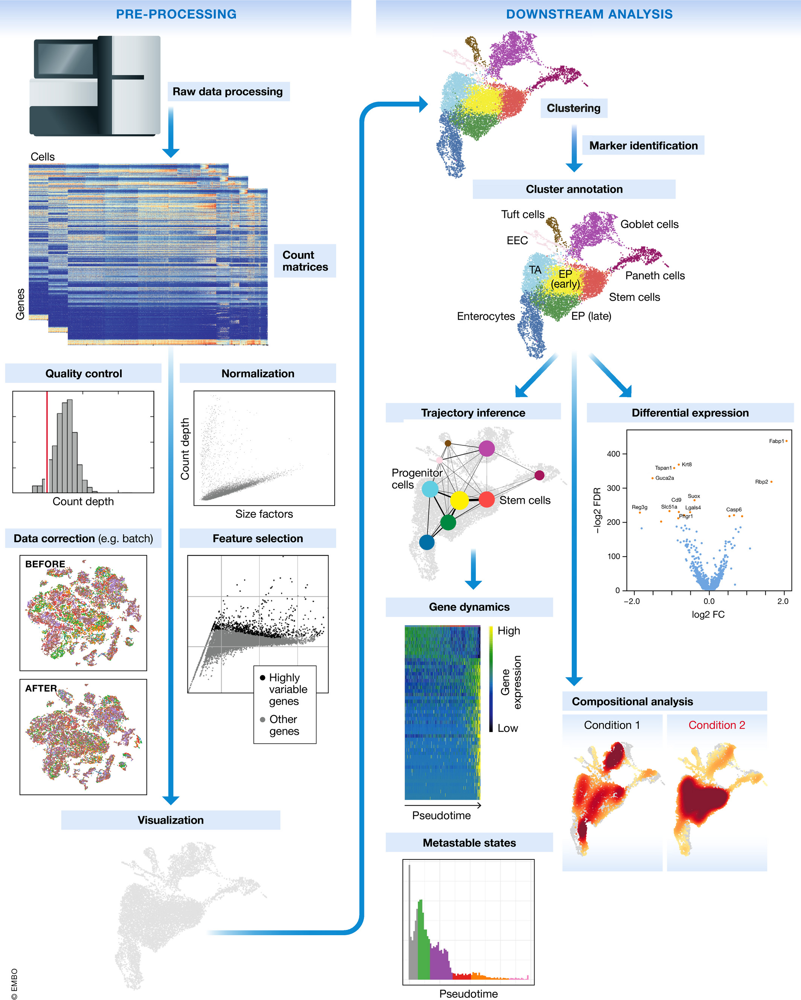

In [ ]:
from IPython.display import Image
Image('/content/msb188746-fig-0001-m.jpg', width=1000)

## Package installation

In [ ]:
# Import and install scvi-tools in google colab
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip install --quiet scvi-tools[tutorials]
    !pip install --quiet gdown
    !pip install --quiet --upgrade seaborn==0.10
    !pip install --quiet bbknn

     |████████████████████████████████| 163kB 6.9MB/s 
     |████████████████████████████████| 112kB 9.1MB/s 
     |████████████████████████████████| 174kB 9.2MB/s 
     |████████████████████████████████| 122kB 10.5MB/s 
     |████████████████████████████████| 51kB 5.6MB/s 
     |████████████████████████████████| 8.7MB 8.9MB/s 
     |████████████████████████████████| 3.2MB 47.4MB/s 
     |████████████████████████████████| 7.7MB 44.4MB/s 
     |████████████████████████████████| 2.4MB 43.3MB/s 
     |████████████████████████████████| 51kB 5.9MB/s 
     |████████████████████████████████| 112kB 45.8MB/s 
     |████████████████████████████████| 51kB 6.2MB/s 
     |████████████████████████████████| 71kB 7.7MB/s 
     |████████████████████████████████| 225kB 6.6MB/s 
     |████████████████████████████████| 655kB 5.3MB/s 


In [ ]:
%%capture
# Downloads pretrained models
!gdown 'https://drive.google.com/uc?id=1VMBmnVcSrCH_wg23AV2URANbghEJ-5W5'
!unzip spleen_lymph_scanvi.zip && rm spleen_lymph_scanvi.zip
!gdown 'https://drive.google.com/uc?id=1we96qktNiVEaprzs44Y1vh5CoCO4RzDx'
!unzip spleen_lymph_scvi.zip && rm spleen_lymph_scvi.zip

In [ ]:
import anndata
import scvi
import scanpy as sc
import numpy as np

# can set the DPI on save here
sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=2

## Dataset preprocessing

**Murine spleen and lymph nodes measured using CITE-seq (~30k cells)**

- Two mice
- Two days

### Load data

Scanpy has a number of [methods](https://scanpy.readthedocs.io/en/stable/api/index.html#reading) to load data from popular formats, including files outputted by Cell Ranger.

In [ ]:
# built-in datasets located in scvi.data
adata = scvi.data.spleen_lymph_cite_seq(run_setup_anndata=False) # default is True. Will set it up for you
adata.obs_names_make_unique()

INFO     Downloading file at data/sln_111.h5ad                                  
Downloading...: 100%|██████████| 66657/66657.0 [00:00<00:00, 102330.16it/s]
INFO     Downloading file at data/sln_208.h5ad                                  
Downloading...: 100%|██████████| 70490/70490.0 [00:00<00:00, 118053.73it/s]


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [ ]:
adata

AnnData object with n_obs × n_vars = 30474 × 13553
    obs: 'batch_indices', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'tissue', 'batch'
    obsm: 'isotypes_htos', 'protein_expression'

### AnnData exploration

AnnData provides a convenient way to store expression data with cell- and gene-level metadata.

Cell-level (resp. gene-level) metadata is accessible with `adata.obs` (resp. `adata.var`), which returns a `pd.DataFrame`.

In [ ]:
bdata = adata.copy()

In [ ]:
bdata.obs.head()

,batch_indices,n_genes,percent_mito,leiden_subclusters,cell_types,tissue,batch
index,,,,,,,
AAACCCAAGGGTAATT-1,0,3137,0.062138,"12,0",NKT,Spleen,SLN111-D1
AAACCCAAGGTAAACT-1,0,2256,0.057545,6,CD122+ CD8 T,Spleen,SLN111-D1
AAACCCACACTAGGTT-1,0,1367,0.058373,3,Transitional B,Spleen,SLN111-D1
AAACCCACAGATACCT-1,0,1567,0.065386,4,Mature B,Lymph_Node,SLN111-D1
AAACCCACAGGAATAT-1,0,1895,0.059644,0,CD4 T,Lymph_Node,SLN111-D1


In [ ]:
bdata.var.head()

""
index
Mrpl15
Lypla1
Tcea1
Atp6v1h
Rb1cc1


In [ ]:
bdata.var_names

Index(['Mrpl15', 'Lypla1', 'Tcea1', 'Atp6v1h', 'Rb1cc1', '4732440D04Rik',
       'Pcmtd1', 'Gm26901', 'Rrs1', 'Adhfe1',
       ...
       'Tmlhe', 'AC133103.1', 'AC132444.1', 'Csprs', 'AC132444.6',
       'AC125149.3', 'AC168977.1', 'PISD', 'DHRSX', 'CAAA01147332.1'],
      dtype='object', name='index', length=13553)

In [ ]:
bdata.X

<30474x13553 sparse matrix of type '<class 'numpy.float32'>'
	with 43762899 stored elements in Compressed Sparse Row format>

In [ ]:
bdata.obs["new_cell_level_data"] = ["test"] * bdata.n_obs

In [ ]:
bdata.obs

,batch_indices,n_genes,percent_mito,leiden_subclusters,cell_types,tissue,batch,new_cell_level_data
index,,,,,,,,
AAACCCAAGGGTAATT-1,0,3137,0.062138,"12,0",NKT,Spleen,SLN111-D1,test
AAACCCAAGGTAAACT-1,0,2256,0.057545,6,CD122+ CD8 T,Spleen,SLN111-D1,test
AAACCCACACTAGGTT-1,0,1367,0.058373,3,Transitional B,Spleen,SLN111-D1,test
AAACCCACAGATACCT-1,0,1567,0.065386,4,Mature B,Lymph_Node,SLN111-D1,test
AAACCCACAGGAATAT-1,0,1895,0.059644,0,CD4 T,Lymph_Node,SLN111-D1,test
...,...,...,...,...,...,...,...,...
TTTGTTGGTGGGCTCT-2,1,785,0.106437,7,Mature B,Spleen,SLN208-D2,test
TTTGTTGTCAAATAGG-2,1,979,0.050457,2,CD8 T,Lymph_Node,SLN208-D2,test
TTTGTTGTCACGAGGA-2,1,747,0.070362,0,CD4 T,Spleen,SLN208-D2,test


### Quality control

In [ ]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [ ]:
adata.var['mt']

index
Mrpl15            False
Lypla1            False
Tcea1             False
Atp6v1h           False
Rb1cc1            False
                  ...  
AC125149.3        False
AC168977.1        False
PISD              False
DHRSX             False
CAAA01147332.1    False
Name: mt, Length: 13553, dtype: bool

In [ ]:
adata.obs.head()

,batch_indices,n_genes,percent_mito,leiden_subclusters,cell_types,tissue,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
index,,,,,,,,,,,
AAACCCAAGGGTAATT-1,0,3137,0.062138,"12,0",NKT,Spleen,SLN111-D1,3126,9836.0,612.0,6.222041
AAACCCAAGGTAAACT-1,0,2256,0.057545,6,CD122+ CD8 T,Spleen,SLN111-D1,2254,7453.0,429.0,5.756071
AAACCCACACTAGGTT-1,0,1367,0.058373,3,Transitional B,Spleen,SLN111-D1,1363,3131.0,183.0,5.844778
AAACCCACAGATACCT-1,0,1567,0.065386,4,Mature B,Lymph_Node,SLN111-D1,1566,4266.0,279.0,6.540085
AAACCCACAGGAATAT-1,0,1895,0.059644,0,CD4 T,Lymph_Node,SLN111-D1,1893,5665.0,338.0,5.966461


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
... storing 'batch' as categorical


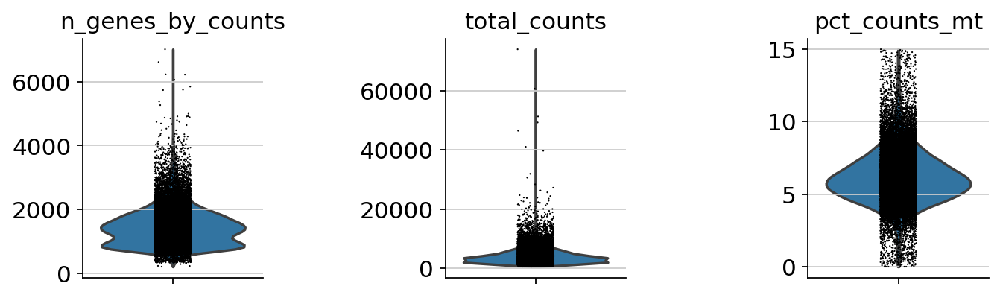

In [ ]:
sc.pl.violin(
    adata,
    [
     'n_genes_by_counts',
     'total_counts',
     'pct_counts_mt'
     ],
    multi_panel=True
)

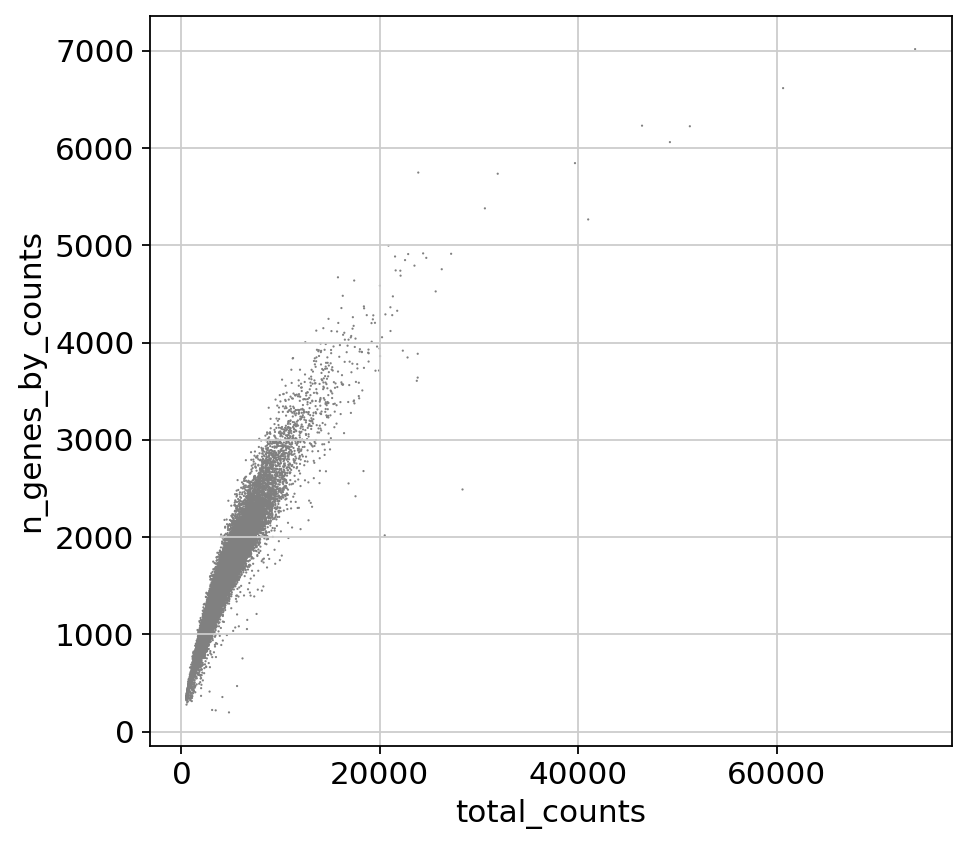

In [ ]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts")

In [ ]:
# example
# adata = adata[adata.obs.pct_counts_mt < 15]

In [ ]:
adata[:, "Cd4"].X.shape

(30474, 1)

### Normalization

Here we use a series of steps to preserve the count data for later, and the log normalized data.

In [ ]:
adata.layers["counts"] = adata.X.copy() # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4) # scale each cell to a common library size
sc.pp.log1p(adata) # log(expression + 1)
adata.raw = adata # freeze the state in `.raw`

In [ ]:
adata

AnnData object with n_obs × n_vars = 30474 × 13553
    obs: 'batch_indices', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'tissue', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    obsm: 'isotypes_htos', 'protein_expression'
    layers: 'counts'

In [ ]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=4000,
    # subset=True, # to automatically subset to the 4000 genes
    layer="counts",
    flavor="seurat_v3"
)

/usr/local/lib/python3.6/dist-packages/scanpy/preprocessing/_highly_variable_genes.py:144: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  df.loc[: int(n_top_genes), 'highly_variable'] = True


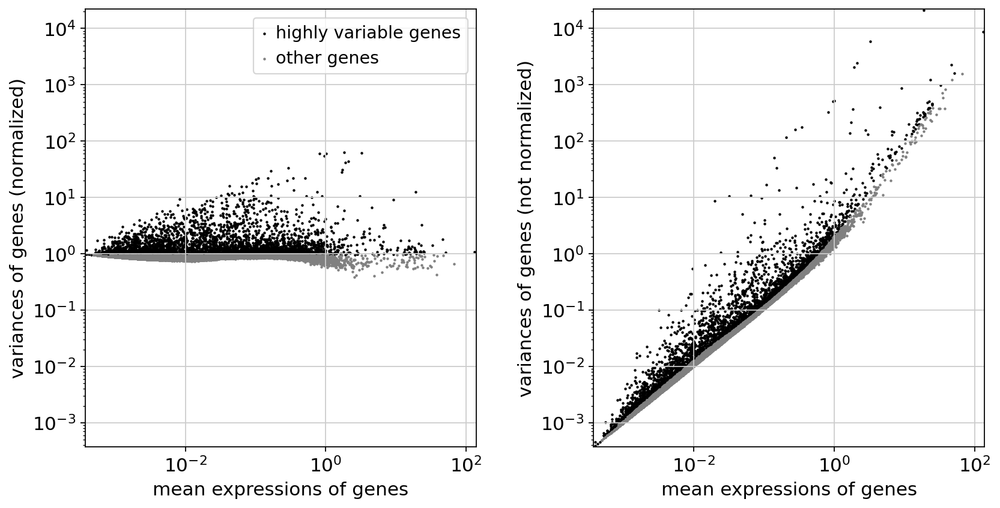

In [ ]:
sc.pl.highly_variable_genes(adata, log=True)

In [ ]:
# subset to highly variable genes
adata = adata[:, adata.var.highly_variable].copy()

In [ ]:
adata

AnnData object with n_obs × n_vars = 30474 × 4000
    obs: 'batch_indices', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'tissue', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg'
    obsm: 'isotypes_htos', 'protein_expression'
    layers: 'counts'

In [ ]:
adata.raw.to_adata()

AnnData object with n_obs × n_vars = 30474 × 13553
    obs: 'batch_indices', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'tissue', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'hvg'
    obsm: 'isotypes_htos', 'protein_expression'

## Standard workflow

The standard workflow consists of

1. Feature-wise scaling
2. Principal components analysis
3. Neighbor graph computation


In [ ]:
sc.pp.scale(adata) # z normalize the columns (genes)
sc.tl.pca(adata)

In [ ]:
adata.obsm["X_pca"].shape

(30474, 50)

In [ ]:
sc.pp.neighbors(adata) # compute nearest neighbors
sc.tl.umap(adata)

In [ ]:
adata.obsm["X_umap"]

array([[10.116939 , 12.445085 ],
       [10.383613 , 15.674242 ],
       [-4.267718 , 17.088062 ],
       ...,
       [ 7.353944 ,  9.091245 ],
       [-1.5452082,  2.495693 ],
       [ 7.308659 ,  8.745914 ]], dtype=float32)

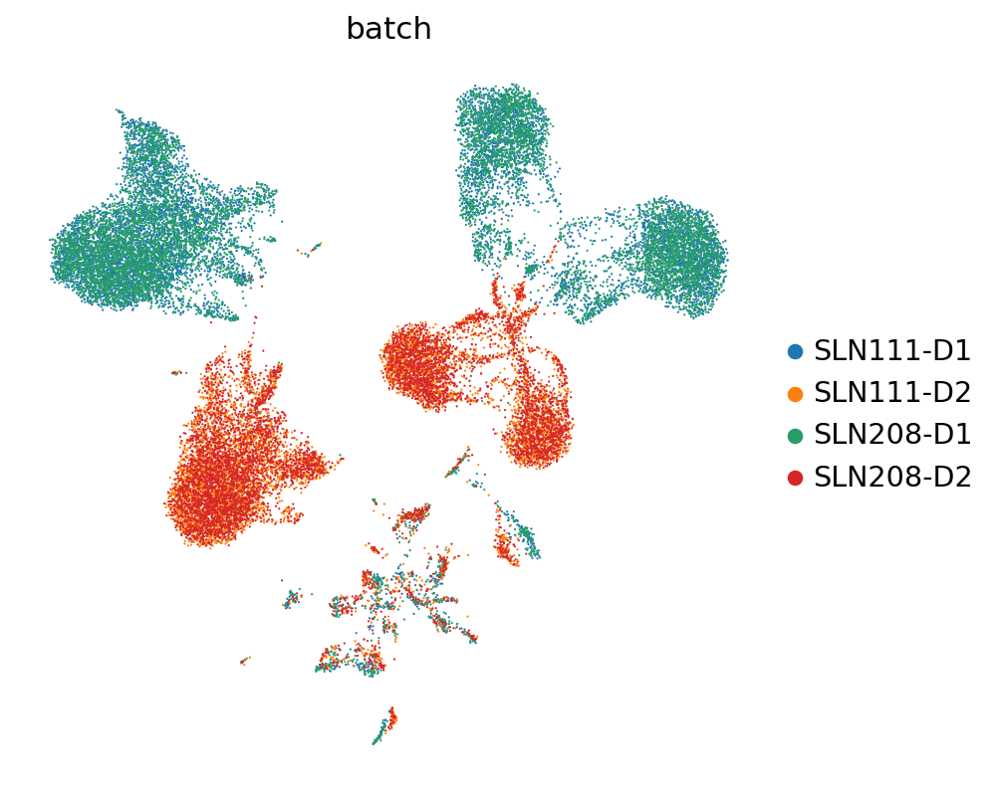

In [ ]:
sc.pl.umap(adata, color="batch")

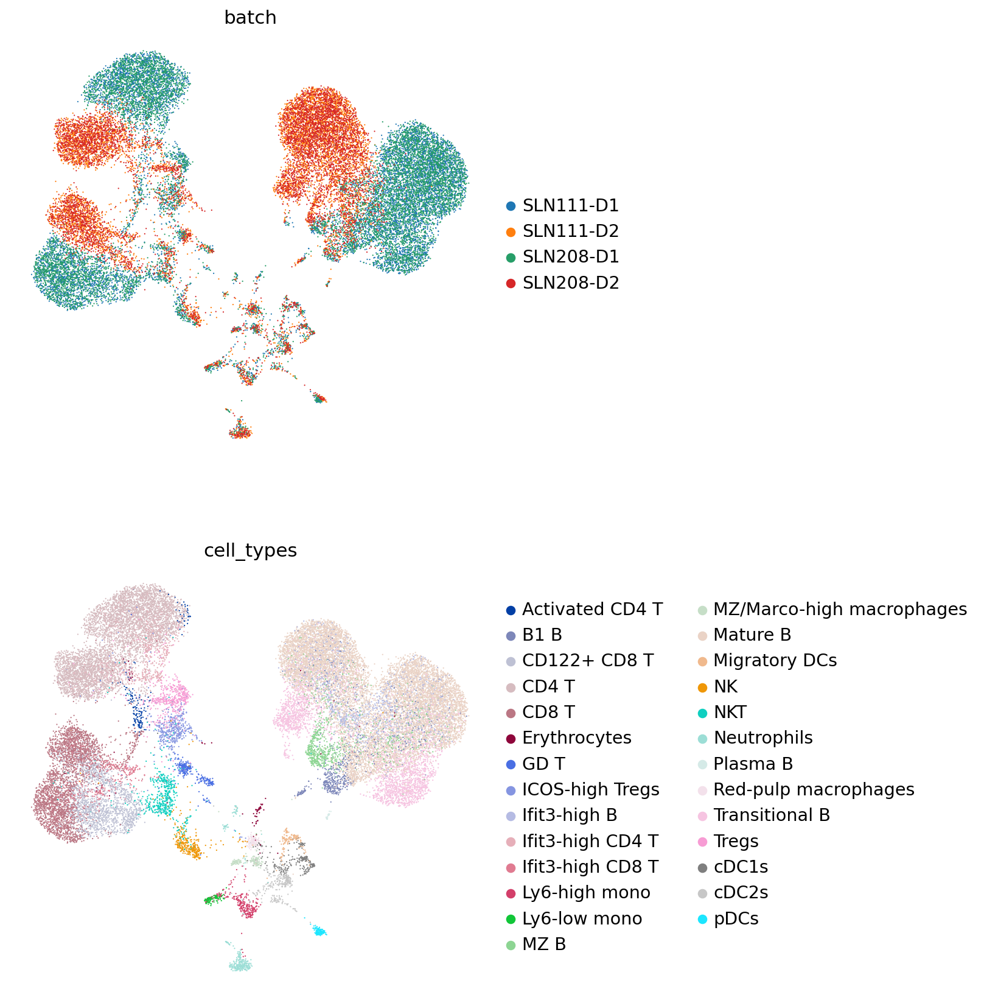

In [ ]:
import scanpy.external as sce
sce.pp.bbknn(adata, batch_key="batch")
sc.tl.umap(adata)
sc.pl.umap(adata, color=["batch", "cell_types"], ncols=1)

## scVI workflow

scVI is a model in the `scvi-tools` package that provides functionality that parallels many of the Scanpy functions including:

- Dimensionality reduction
- Integration
- Differential expression

scVI excels at learning integrated low-dimensional latent spaces, and is highly scalable in the number of datasets to integrate, as well as the number of cells.
scVI runs much faster with a discrete GPU, which makes Colab the perfect place to process datasets with scVI.


In [ ]:
%%capture
!wget https://www.embopress.org/cms/asset/bba07e1a-bdab-419c-888b-9bff3e306d4c/msb199198-fig-0002-m.jpg

- Lopez, R., Gayoso, A., & Yosef, N. (2020). Enhancing scientific discoveries in molecular biology with deep generative models. Molecular Systems Biology, 16(9), e9198.
[Image source](https://www.embopress.org/doi/full/10.15252/msb.20199198)

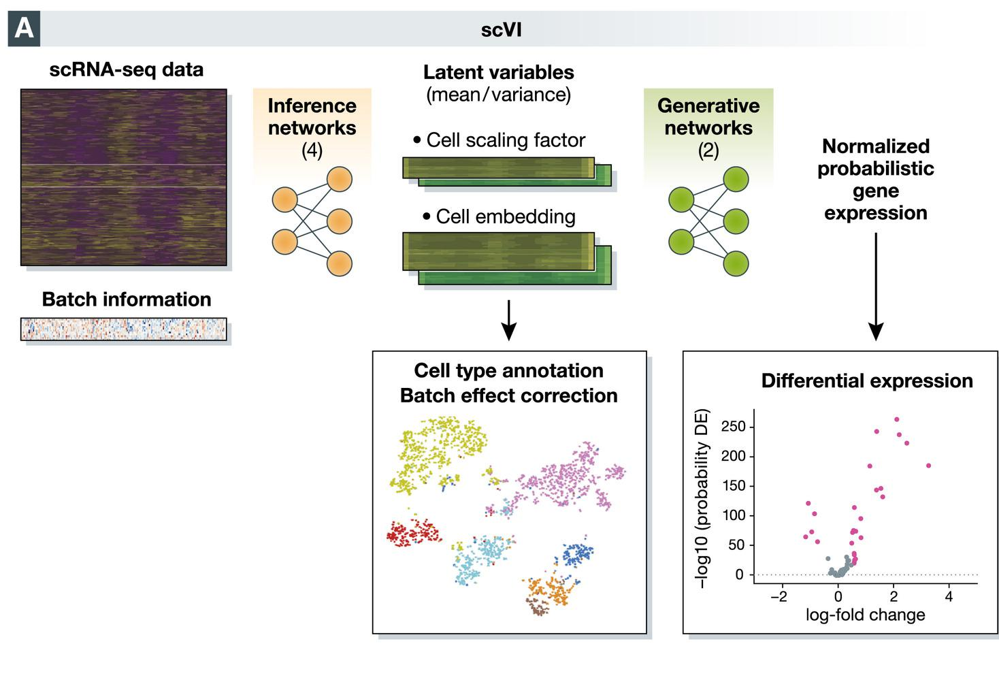

In [ ]:
from IPython.display import Image
from PIL import Image as PILImage
im = PILImage.open('/content/msb199198-fig-0002-m.jpg')
width, height = im.size
im1 = im.crop((0, 0, width / 1.45, height / 1.85))
im1.save("scvi.jpg")

Image('scvi.jpg', width=1000)

### Setup anndata

`setup_anndata` alerts `scvi-tools` models to the location of relevant data in the `AnnData` object. As `scvi-tools` models require the count data, we need to specify the layer containing the counts. We'd also like to perform integration over the `'batch'` metadata, so we use the `batch_key` parameter.

See [here](https://www.scvi-tools.org/en/stable/api/reference/scvi.data.setup_anndata.html#scvi.data.setup_anndata) for the full documentation of this function.

In [ ]:
# tell scvi where to get the data
scvi.data.setup_anndata(adata, layer="counts", batch_key='batch')

INFO     Using batches from adata.obs["batch"]                                  
INFO     No label_key inputted, assuming all cells have same label              
INFO     Using data from adata.layers["counts"]                                 
INFO     Computing library size prior per batch                                 
INFO     Successfully registered anndata object containing 30474 cells, 4000    
         vars, 4 batches, 1 labels, and 0 proteins. Also registered 0 extra     
         categorical covariates and 0 extra continuous covariates.              
INFO     Please do not further modify adata until model is trained.             


For visual confirmation of how `scvi-tools` registered this information, we run `view_anndata_setup`.

In [ ]:
scvi.data.view_anndata_setup(adata)

Anndata setup with scvi-tools version 0.7.1.


### Train model and store outputs

```python
model = scvi.model.SCVI(adata, use_cuda=True)
model.train()
model.save("spleen_lymph_cite_scvi", overwrite=True)
```

In [ ]:
model = scvi.model.SCVI.load('spleen_lymph_scvi', adata)

INFO     Using data from adata.layers["counts"]                                 
INFO     Computing library size prior per batch                                 
INFO     Registered keys:['X', 'batch_indices', 'local_l_mean', 'local_l_var',  
         'labels']                                                              
INFO     Successfully registered anndata object containing 30474 cells, 4000    
         vars, 4 batches, 27 labels, and 0 proteins. Also registered 0 extra    
         categorical covariates and 0 extra continuous covariates.              


In [ ]:
model

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: zinb, latent_distribution: normal
Training status: Trained


To print summary of associated AnnData, use: 
scvi.data.view_anndata_setup(model.adata)


In [ ]:
adata.obsm["X_scvi"] = model.get_latent_representation()

In [ ]:
adata.layers["scvi_expr"] = model.get_normalized_expression(adata, n_samples=5, return_mean=True)

### Exploratory analysis

In [ ]:
sc.pp.neighbors(adata, use_rep="X_scvi", metric="correlation")
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=1.2)
sc.tl.umap(adata, min_dist=0.4)

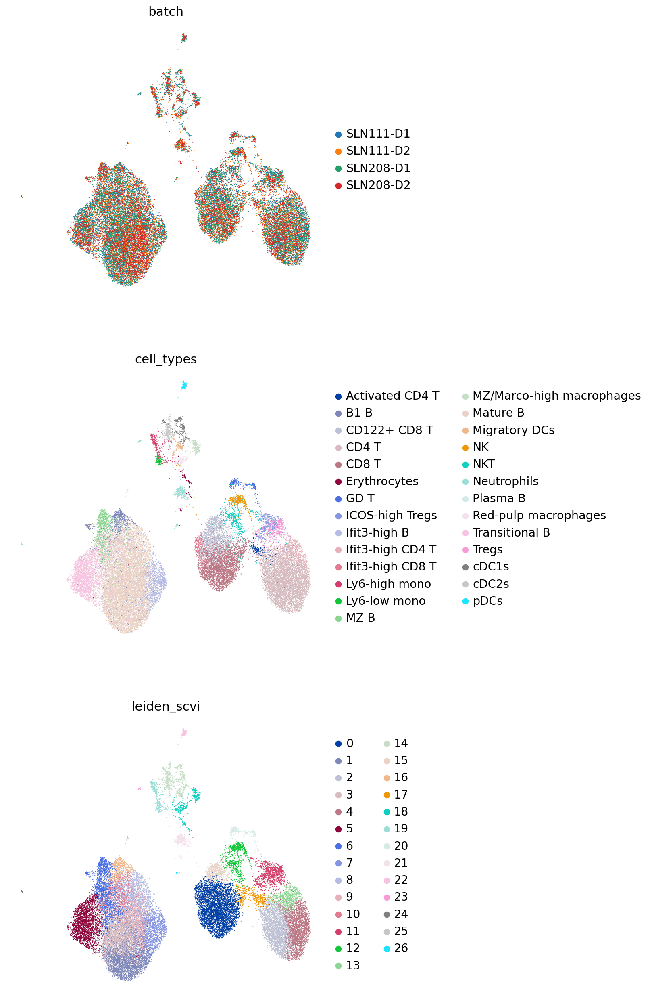

In [ ]:
sc.pl.umap(
    adata,
    color=["batch", "cell_types", "leiden_scvi"],
    frameon=False,
    ncols=1
)

In [ ]:
sc.tl.leiden(adata, restrict_to=("leiden_scvi", ["14"]), key_added="leiden_subclusters")

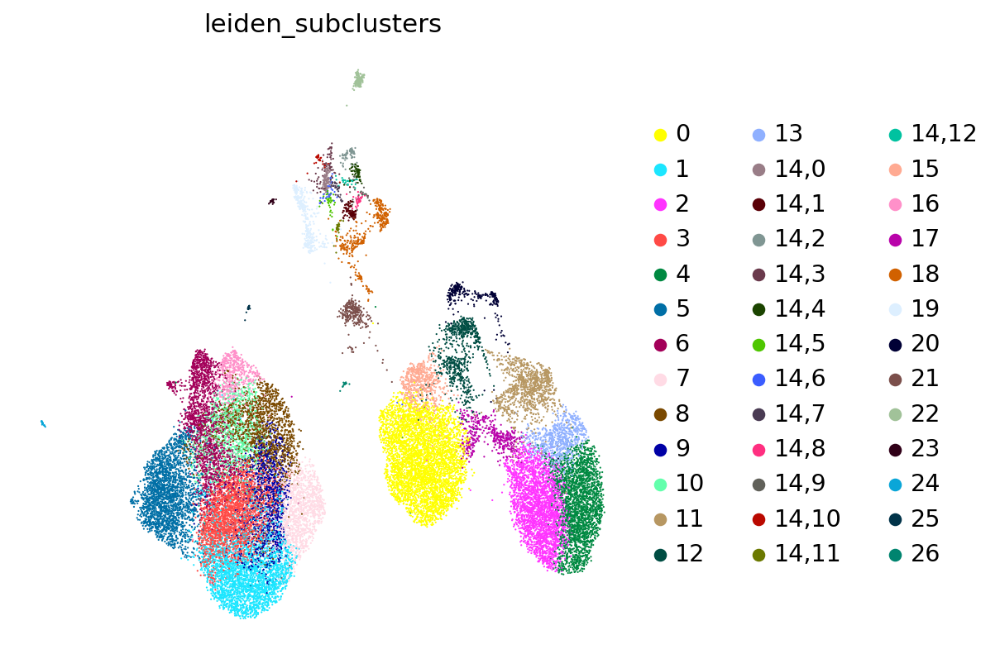

In [ ]:
sc.pl.umap(
    adata,
    color=["leiden_subclusters"],
    frameon=False,
    ncols=1
)

## Differential expression


### scVI DE

The **`change`** mode follows protocol described in [Boyeau et al](https://www.biorxiv.org/content/10.1101/794289v1).

We are comparing $h_{1g}$, the "decoded" expression of gene $g$ in cell type 1, with $h_{2g}$, the "decoded" expression of $g$ in cell type 2.
    
The hypotheses are:

$$
M^g_1: |f(h_{1g}, h_{2g})|  > \delta
$$

$$
M^g_0: |f(h_{1g}, h_{2g})| \leq \delta
$$

where $\delta$ is a user-defined effect size threshold, and $f$ is the log fold change of experssion.

DE "significance" between cell types 1 and 2 for each gene can then be based on the Bayes factors:

$$
\text{Natural Log Bayes Factor for gene g in cell types 1 and 2} = \ln ( {BF^g_{10}) = \ln(\frac{ p(M^g_1 | x_1, x_2)}{p(M^g_0 | x_1, x_2)}})
$$

**Note that the scvi returns the _natural logarithm_ of the Bayes Factor.  


... storing 'blobs' as categorical


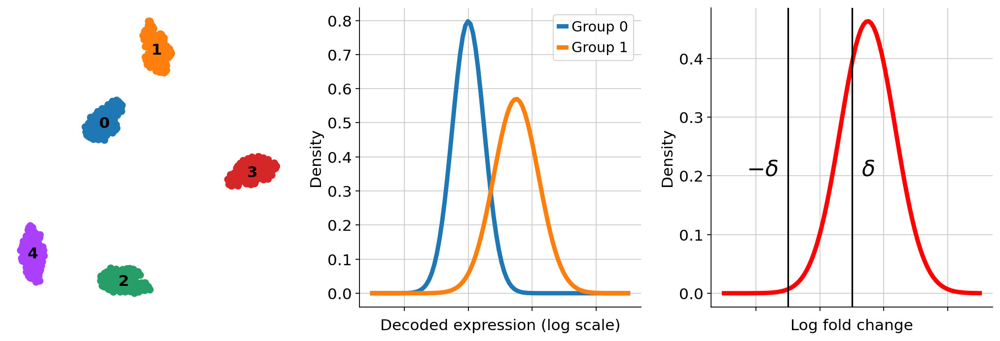

In [ ]:
import scipy.stats as stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, axarr = plt.subplots(1, 3, figsize=(16, 5), gridspec_kw=dict(wspace=0.25))

sim = sc.datasets.blobs()
sc.pp.scale(sim)
sc.tl.pca(sim)
sc.pp.neighbors(sim)
sc.tl.umap(sim)
sc.pl.umap(
    sim,
    color="blobs",
    ax=axarr[0],
    show=False,
    legend_loc="on data",
    title=""
)

x = np.linspace(-3, 5, 100)
y_a = stats.norm.pdf(x, 0, 0.5)
y_b = stats.norm.pdf(x, 1.5, 0.7)
axarr[1].plot(x, y_a, linewidth=4, label="Group 0")
axarr[1].plot(x, y_b, linewidth=4, label="Group 1")
axarr[1].set_xticklabels([])
axarr[1].set_xlabel("Decoded expression (log scale)")
axarr[1].set_ylabel("Density")
axarr[1].legend()

lfc = stats.norm.pdf(x, 1.5, np.sqrt(0.5**2 + 0.7**2))
axarr[2].plot(x, lfc, linewidth=4, label="lfc", c="red")
axarr[2].axvline(x=-1, c="black")
axarr[2].axvline(x=1, c="black")
axarr[2].text(-2.3, 0.2, r"$-\delta$", fontsize=20)
axarr[2].text(1.3, 0.2, r"$\delta$", fontsize=20)
axarr[2].set_xticklabels([])
axarr[2].set_xlabel("Log fold change")
axarr[2].set_ylabel("Density")

sns.despine()

In [ ]:
# one vs all, over all groups
full_de_res = model.differential_expression(groupby='cell_types')
full_de_res.head()

DE...: 100%|██████████| 27/27 [02:36<00:00,  5.78s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison
index,,,,,,,,,,,,,,,,,,
Penk,0.9906,0.0094,4.657600,6.882120e-04,0.000042,7.208207,7.629348,3.479776,-6.615546,23.300163,0.000000,0.005049,0.000000,0.001188,0.000000,0.024535,True,Activated CD4 T vs Rest
Itm2a,0.9882,0.0118,4.427785,1.543982e-03,0.000090,3.981596,3.898249,2.039388,-4.079432,11.580247,3.388236,0.130808,0.541176,0.092166,13.841511,0.732621,True,Activated CD4 T vs Rest
Tifa,0.9856,0.0144,4.226022,1.940231e-06,0.000035,-4.101058,-4.035124,2.253549,-12.047850,5.949379,0.011765,0.054349,0.011765,0.045539,0.095564,0.336981,True,Activated CD4 T vs Rest
Tnfrsf9,0.9852,0.0148,4.198217,4.755698e-04,0.000029,5.469736,5.664081,3.174607,-7.955194,16.546959,0.900001,0.030788,0.329412,0.016598,4.199742,0.169912,True,Activated CD4 T vs Rest
Arg1,0.9840,0.0160,4.119037,7.031809e-08,0.000004,-5.600206,-5.846691,3.416564,-17.329275,5.666544,0.000000,0.001254,0.000000,0.000858,0.000000,0.008194,True,Activated CD4 T vs Rest


In [ ]:
# comparison between groups:
de_btwn_groups = model.differential_expression(groupby='cell_types', group1 = "CD4 T" , group2 = "CD8 T")
de_btwn_groups.head()

DE...: 100%|██████████| 1/1 [00:05<00:00,  5.44s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison
index,,,,,,,,,,,,,,,,,,
Cd8b1,0.9980,0.0020,6.212601,0.000334,0.004032,-3.819321,-3.847900,1.213745,-7.759580,1.510383,0.105233,7.803128,0.092875,0.987355,0.859439,48.253807,True,CD4 T vs CD8 T
Cxcr6,0.9974,0.0026,5.949637,0.000006,0.000187,-5.555687,-5.625024,1.992270,-13.172245,1.729538,0.003669,0.368080,0.003476,0.254956,0.025926,2.079570,True,CD4 T vs CD8 T
Zbtb7b,0.9928,0.0072,4.926447,0.000204,0.000024,3.286811,3.295545,1.358725,-1.812649,7.618464,0.304887,0.017772,0.251979,0.014012,2.257973,0.071308,True,CD4 T vs CD8 T
Cd8a,0.9922,0.0078,4.845800,0.000346,0.001354,-2.052828,-2.057175,0.762448,-5.155528,1.324485,0.013902,2.633284,0.013902,0.846890,0.113993,15.091876,True,CD4 T vs CD8 T
Cst7,0.9906,0.0094,4.657600,0.000019,0.000120,-2.811349,-2.872921,1.120046,-7.429485,1.767991,0.025681,0.269651,0.024522,0.210185,0.149500,1.406220,True,CD4 T vs CD8 T


In [ ]:
# one v all
de_btwn_groups = model.differential_expression(groupby='cell_types', group1 = "CD4 T")
de_btwn_groups.head()

DE...: 100%|██████████| 1/1 [00:05<00:00,  5.83s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison
index,,,,,,,,,,,,,,,,,,
Pltp,0.9872,0.0128,4.345427,0.000003,0.000075,-4.144828,-4.312175,1.997517,-10.428622,6.821662,0.001159,0.041510,0.001159,0.021506,0.008529,0.195206,True,CD4 T vs Rest
Gm14718,0.9850,0.0150,4.184591,0.000065,0.000007,5.039978,5.229210,2.606511,-2.899518,13.779025,0.022784,0.003202,0.018343,0.002451,0.148170,0.019888,True,CD4 T vs Rest
Trav5-4,0.9834,0.0166,4.081613,0.000092,0.000044,5.983845,7.199047,5.013809,-8.962235,20.337322,0.008303,0.002332,0.005793,0.001423,0.050005,0.012276,True,CD4 T vs Rest
Trav19,0.9812,0.0188,3.954919,0.004090,0.001298,7.690127,8.198686,6.671428,-9.729126,31.530838,0.006758,0.001977,0.003669,0.001265,0.050496,0.010320,True,CD4 T vs Rest
Tns4,0.9810,0.0190,3.944133,0.000347,0.000027,5.736243,5.689125,3.805875,-5.436551,23.033546,0.000965,0.003123,0.000193,0.002728,0.012703,0.011377,True,CD4 T vs Rest


### Scanpy DE

Scanpy offers access to the Wilcoxon rank-sum test and t-test (default), among others.

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="cell_types")

In [ ]:
sc.get.rank_genes_groups_df(adata, group="Tregs")

,scores,names,logfoldchanges,pvals,pvals_adj
0,34.690506,Ikzf2,5.586389,4.698506e-138,5.585865e-136
1,32.088749,Trbc2,2.518405,7.584135e-129,8.157761e-127
2,27.928772,Ms4a4b,2.209445,6.800489e-108,5.908142e-106
3,27.879047,Ccnd2,2.173910,3.703943e-107,3.157204e-105
4,25.007523,Smc4,2.238006,3.209125e-92,2.363764e-90
...,...,...,...,...,...
13548,-77.298813,Ebf1,-5.216238,0.000000e+00,0.000000e+00
13549,-79.763710,Cd79a,-5.292353,0.000000e+00,0.000000e+00
13550,-80.512634,H2-DMb2,-6.062052,0.000000e+00,0.000000e+00
13551,-81.749832,Ms4a1,-5.421185,0.000000e+00,0.000000e+00


## Visualization

We sort the scVI DE results to focus on genes that are sufficiently expressed, significant, and have high LFC.

In [ ]:
markers = {}
cats = adata.obs.cell_types.cat.categories
for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)
    cell_type_df = full_de_res.loc[full_de_res.comparison == cid]
    cell_type_df = cell_type_df.sort_values("lfc_mean", ascending=False)

    # those genes with higher expression in group 1
    cell_type_df = cell_type_df[cell_type_df.lfc_mean > 0]

    # significance
    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    # genes with sufficient expression
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    markers[c] = cell_type_df.index.tolist()[:3]

Computing a dendrogram is useful for Scanpy's visualization functions.

In [ ]:
sc.tl.dendrogram(adata, groupby="cell_types", use_rep="X_scvi")


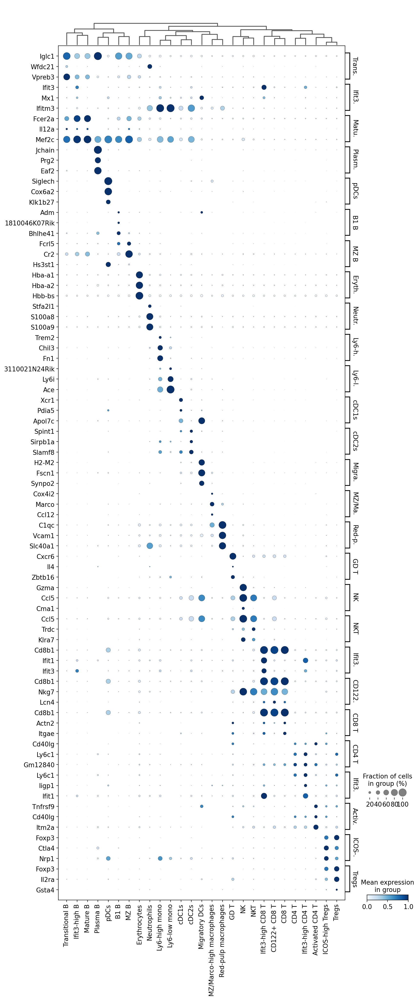

In [ ]:
sc.pl.dotplot(
    adata,
    markers,
    groupby='cell_types',
    dendrogram=True,
    color_map="Blues",
    swap_axes=True,
    use_raw=True,
    standard_scale="var",
)

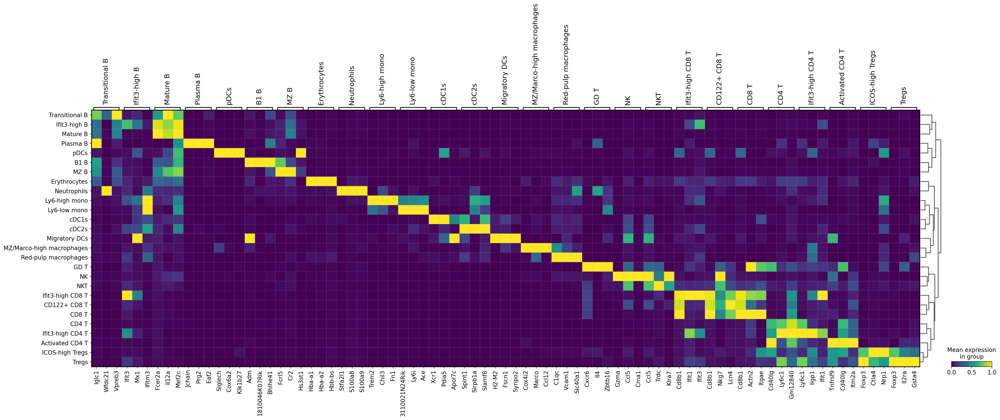

In [ ]:
sc.pl.matrixplot(
    adata,
    markers,
    groupby='cell_types',
    standard_scale="var",
    # layer="scvi_expr",
    dendrogram=True,
)

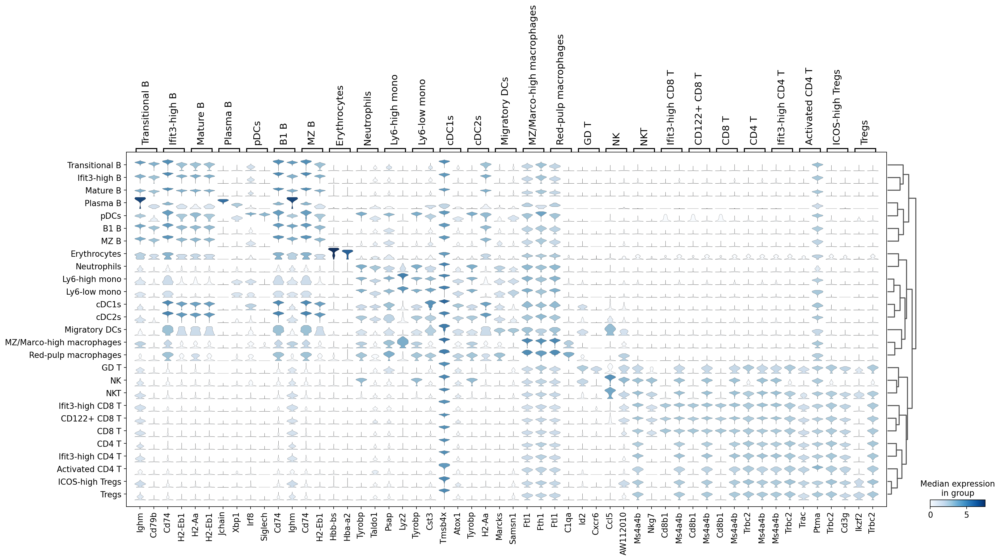

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=2)

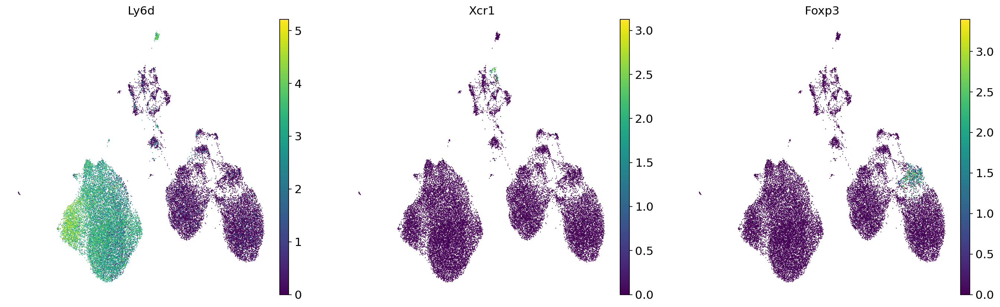

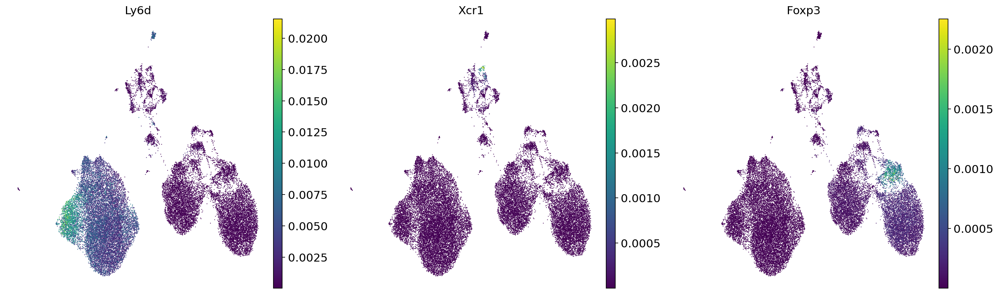

In [ ]:
sc.pl.umap(adata, color=["Ly6d", "Xcr1", "Foxp3"])
sc.pl.umap(adata, color=["Ly6d", "Xcr1", "Foxp3"], layer="scvi_expr")

### Embedding density

In [ ]:
sc.tl.embedding_density(adata, groupby="tissue", key_added="tissue_density")

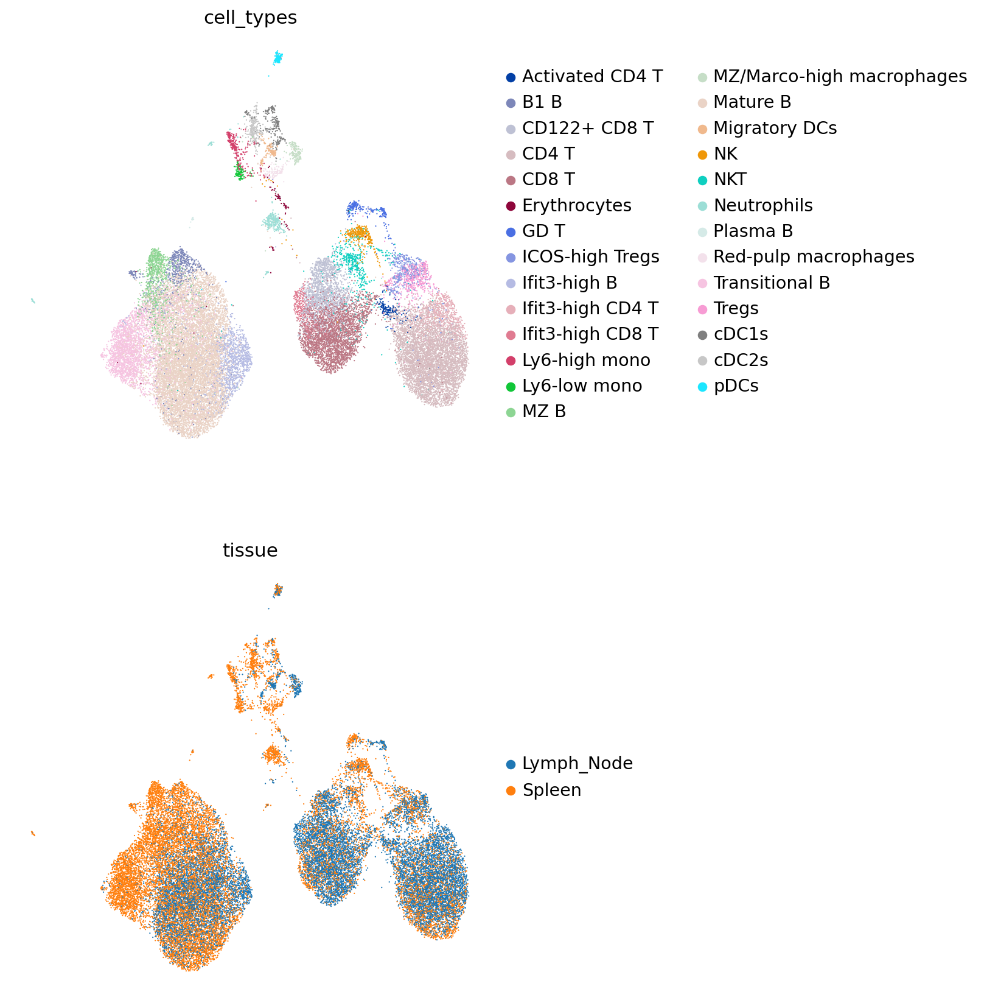

In [ ]:
sc.pl.umap(adata, color=["cell_types", "tissue"], ncols=1)

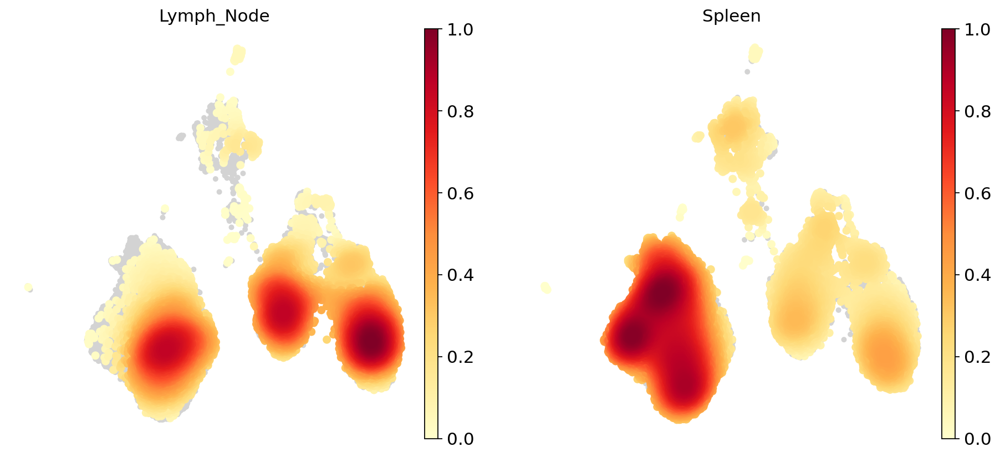

In [ ]:
sc.pl.embedding_density(adata, key="tissue_density")

## SCANVI for label tranfer

We've used our previous workflow to explore and annotate our dataset. Now consider the case where we run more samples and would like to automate the annotation of these new cells. scANVI was designed just for this -- automated label transfer.

### Preprocessing

We have a bit of a class imbalance problem, so we only allow scANVI to "see" a subset of the labels such that the classes have better balance.

In [ ]:
adata

AnnData object with n_obs × n_vars = 30474 × 4000
    obs: 'batch_indices', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'tissue', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', '_scvi_raw_norm_scaling', 'tissue_density'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'cell_types_colors', '_scvi', 'leiden', 'leiden_scvi_colors', 'leiden_subclusters_colors', 'rank_genes_groups', "dendrogram_['cell_types']", 'tissue_density_params', 'tissue_colors'
    obsm: 'isotypes_htos', 'protein_expression', 'X_pca', 'X_umap', 'X_scvi'
    varm: 'PCs'
    layers: 'counts', 'scvi_expr'
    obsp: 'distances', 'connectivities'

In [ ]:
adata.obs[["cell_types"]].value_counts()

cell_types               
Mature B                     9936
CD4 T                        5179
CD8 T                        2926
Transitional B               2735
CD122+ CD8 T                 1633
Ifit3-high B                 1301
MZ B                          928
B1 B                          660
Ifit3-high CD4 T              653
NKT                           530
Tregs                         524
ICOS-high Tregs               432
Ifit3-high CD8 T              390
NK                            341
Neutrophils                   313
Ly6-high mono                 269
GD T                          265
cDC2s                         263
cDC1s                         253
MZ/Marco-high macrophages     178
Activated CD4 T               170
Migratory DCs                 134
pDCs                          130
Red-pulp macrophages          124
Ly6-low mono                  106
Erythrocytes                   82
Plasma B                       19
dtype: int64

In [ ]:
#helper function which returns n_samples indices per label in labels_key
def subsample_dataset(train_data, labels_key, n_samples):
    sample_idx = []
    labels, counts = np.unique(train_data.obs[labels_key], return_counts=True)
    for i, label in enumerate(labels):
        label_locs = np.where(train_data.obs[labels_key] == label)[0]
        if counts[i] < n_samples:
            sample_idx.append(label_locs)
        else:
            label_subset = np.random.choice(label_locs, n_samples, replace=False)
            sample_idx.append(label_subset)
    sample_idx = np.concatenate(sample_idx)
    return sample_idx

In [ ]:
batch_1_idx = np.where(adata.obs['batch'] == 'SLN111-D1')[0]
batch_2_idx = np.where(adata.obs['batch'] == 'SLN111-D2')[0]
batch_3_idx = np.where(adata.obs['batch'] == 'SLN208-D1')[0]
batch_4_idx = np.where(adata.obs['batch'] == 'SLN208-D2')[0]

labelled_batch_idx = np.concatenate((batch_1_idx, batch_3_idx)) #train on these batches
unlabelled_batch_idx = np.concatenate((batch_2_idx, batch_4_idx)) #make predictions on these batches

labelled_adata = adata[labelled_batch_idx].copy()
unlabelled_adata = adata[unlabelled_batch_idx].copy()
del unlabelled_adata.uns["_scvi"]

sample_idx = subsample_dataset(labelled_adata, 'cell_types', 100)
labelled_adata.obs['labels_for_scanvi'] = 'unknown'
labelled_adata.obs['labels_for_scanvi'].iloc[sample_idx] = labelled_adata.obs['cell_types'][sample_idx]

unlabelled_adata.obs['labels_for_scanvi'] = 'unknown'

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [ ]:
scandata = labelled_adata.concatenate(unlabelled_adata, batch_key="_batch")

In [ ]:
scandata.obs[["labels_for_scanvi"]].value_counts()

labels_for_scanvi        
unknown                      28064
Mature B                       100
B1 B                           100
CD122+ CD8 T                   100
CD4 T                          100
CD8 T                          100
GD T                           100
ICOS-high Tregs                100
Ifit3-high B                   100
Ifit3-high CD4 T               100
Ifit3-high CD8 T               100
Ly6-high mono                  100
MZ B                           100
NK                             100
NKT                            100
Neutrophils                    100
Transitional B                 100
Tregs                          100
cDC1s                          100
cDC2s                          100
Activated CD4 T                100
MZ/Marco-high macrophages       98
pDCs                            73
Ly6-low mono                    62
Migratory DCs                   61
Red-pulp macrophages            55
Erythrocytes                    53
Plasma B                     

In [ ]:
scvi.data.setup_anndata(scandata, batch_key='batch', labels_key = 'labels_for_scanvi', layer = 'counts')

INFO     Using batches from adata.obs["batch"]                                  
INFO     Using labels from adata.obs["labels_for_scanvi"]                       
INFO     Using data from adata.layers["counts"]                                 
INFO     Computing library size prior per batch                                 
INFO     Successfully registered anndata object containing 30474 cells, 4000    
         vars, 4 batches, 28 labels, and 0 proteins. Also registered 0 extra    
         categorical covariates and 0 extra continuous covariates.              
INFO     Please do not further modify adata until model is trained.             


### Train model

```python
model = scvi.model.SCANVI(adata, unlabeled_category='unknown')
model.train(n_epochs_semisupervised = 20)
model.save('spleen_lymph_scanvi')
```

In [ ]:
scanvi = scvi.model.SCANVI(scandata, unlabeled_category="unknown", pretrained_model=model)
scanvi.train(n_epochs_semisupervised=20)

INFO     Training Unsupervised Trainer for 263 epochs.                          
INFO     Training SemiSupervised Trainer for 20 epochs.                         
INFO     KL warmup phase exceeds overall training phaseIf your applications rely
         on the posterior quality, consider training for more epochs or reducing
         the kl warmup.                                                         
INFO     KL warmup for 400 epochs                                               
Training...: 100%|██████████| 20/20 [02:45<00:00,  8.25s/it]
INFO     Training is still in warming up phase. If your applications rely on the
         posterior quality, consider training for more epochs or reducing the kl
         warmup.                                                                
INFO     Training time:  165 s. / 20 epochs                                     


In [ ]:
unlabelled_adata.obs["C_scANVI"] = scanvi.predict(unlabelled_adata)
unlabelled_adata.obsm["X_scANVI"] = scanvi.get_latent_representation(unlabelled_adata)

INFO     Input adata not setup with scvi. attempting to transfer anndata setup  
INFO     Using data from adata.layers["counts"]                                 
INFO     Computing library size prior per batch                                 
INFO     Registered keys:['X', 'batch_indices', 'local_l_mean', 'local_l_var',  
         'labels']                                                              
INFO     Successfully registered anndata object containing 13473 cells, 4000    
         vars, 4 batches, 28 labels, and 0 proteins. Also registered 0 extra    
         categorical covariates and 0 extra continuous covariates.              


In [ ]:
sc.pp.neighbors(unlabelled_adata, use_rep="X_scANVI", metric="correlation")
sc.tl.umap(unlabelled_adata, min_dist=0.4)

... storing 'labels_for_scanvi' as categorical
... storing 'C_scANVI' as categorical


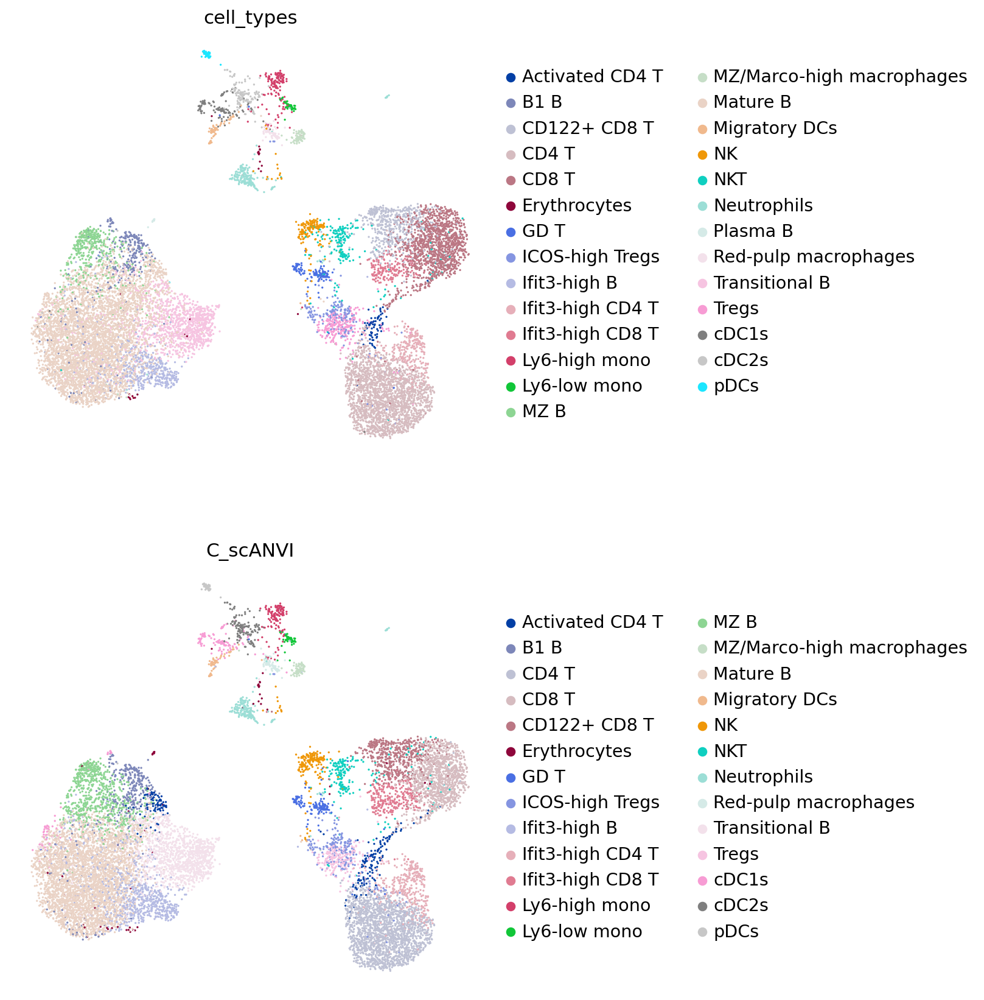

In [ ]:
sc.pl.umap(unlabelled_adata, color=["cell_types", "C_scANVI"], ncols=1)

In [ ]:
df = unlabelled_adata.obs.groupby(["cell_types", "C_scANVI"]).size().unstack(fill_value=0)

Text(0, 0.5, 'Observed')

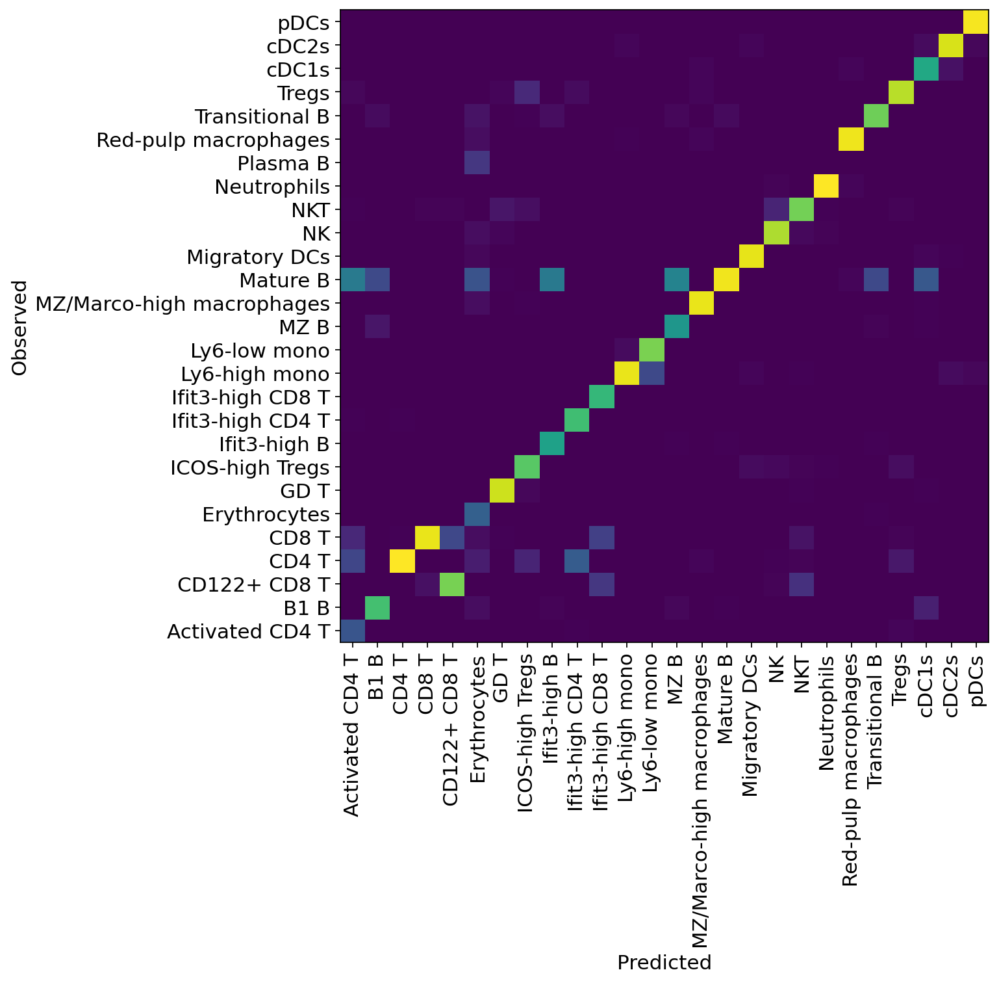

In [ ]:
import matplotlib.pyplot as plt
df = df / df.sum(axis=0)

plt.figure(figsize=(8, 8))
_ = plt.pcolor(df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

## SCVI in R

https://www.scvi-tools.org/en/stable/user_guide/notebooks/scvi_in_R.html